In [1]:
import os
from glob import glob
import random
from tqdm import tqdm
import numpy as np
import pandas as pd
from IPython.display import FileLink
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings('ignore')
import seaborn as sns 
%matplotlib inline
from IPython.display import display, Image
import matplotlib.image as mpimg
import cv2
import re
from datetime import datetime

from sklearn.model_selection import train_test_split
from sklearn.datasets import load_files       
from keras.utils import to_categorical
from sklearn.utils import shuffle
from sklearn.metrics import classification_report

from tensorflow.keras.models import Sequential, Model, load_model
from tensorflow.keras.layers import Input, Conv2D, MaxPooling2D, Flatten, Dense, Dropout, BatchNormalization, GlobalAveragePooling2D
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.preprocessing import image
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping
from tensorflow.keras.applications.mobilenet import preprocess_input
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.applications import MobileNet
from tensorflow.keras.applications.mobilenet import preprocess_input
from tensorflow.keras.preprocessing import image


In [2]:
import tensorflow as tf
print("TensorFlow version:", tf.__version__)
print("Available devices:")
print(tf.config.list_physical_devices())

# Specifically check for GPU availability using the updated method
print("GPUs available:", tf.config.list_physical_devices('GPU'))

TensorFlow version: 2.13.0
Available devices:
[PhysicalDevice(name='/physical_device:CPU:0', device_type='CPU'), PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]
GPUs available: [PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]


In [3]:
dataset = pd.read_csv('driver_imgs_list.csv')
dataset.head(5)

,subject,classname,img
0,p002,c0,img_44733.jpg
1,p002,c0,img_72999.jpg
2,p002,c0,img_25094.jpg
3,p002,c0,img_69092.jpg
4,p002,c0,img_92629.jpg


In [4]:
dataset.shape

(22424, 3)

In [5]:
# Groupby subjects
by_drivers = dataset.groupby('subject') 
# Groupby unique drivers
unique_drivers = by_drivers.groups.keys() # drivers id
print('There are : ',len(unique_drivers), ' unique drivers')
print('There is a mean of ',round(dataset.groupby('subject').count()['classname'].mean()), ' images by driver.')

There are :  26  unique drivers
There is a mean of  862  images by driver.


The 10 classes to classify are :

- c0: safe driving
- c1: texting - right
- c2: talking on the phone - right
- c3: texting - left
- c4: talking on the phone - left
- c5: operating the radio
- c6: drinking
- c7: reaching behind
- c8: hair and makeup
- c9: talking to passenger

In [6]:
CLASSES = 10 # 10 classes
# Define paths to your training and validation datasets
TRAIN_DIR = r'train'
VALIDATION_DIR = r'validation'
TEST_DIR = r'test'

# EDA

In [47]:
def calculate_dataset_statistics(train_dir, validation_dir, test_dir):
    # Load the list of category names from the train directory subfolders
    categories = [os.path.basename(os.path.normpath(subdir)) for subdir in sorted(glob(os.path.join(train_dir, "*/")))]
    
    # Calculate the size of the training set by counting files in each subdirectory
    train_files = glob(os.path.join(train_dir, "*", "*.jpg"))
    train_size = len(train_files)

    # Calculate the size of the validation set by counting files in each subdirectory
    validation_files = glob(os.path.join(validation_dir, "*", "*.jpg"))
    validation_size = len(validation_files)
    
    # Calculate the size of the test set directly since it doesn't have subdirectories
    test_files = glob(os.path.join(test_dir, "*.jpg"))
    test_size = len(test_files)
    
    # Print statistics
    print('There are %s total images.' % (train_size + validation_size + test_size))
    print('There are %d training images.' % train_size)
    print('There are %d validation images.' % validation_size)
    print('There are %d total training categories.' % len(categories))
    print('There are %d test images.' % test_size)


In [48]:
calculate_dataset_statistics(TRAIN_DIR, VALIDATION_DIR, TEST_DIR)

There are 102150 total images.
There are 17943 training images.
There are 4481 validation images.
There are 10 total training categories.
There are 79726 test images.


## Data visualisation

Number of images by category

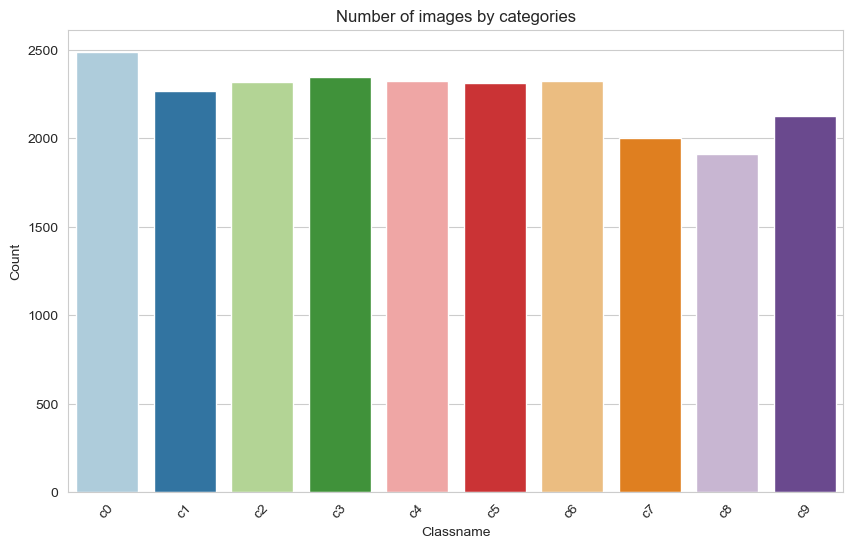

In [9]:
sns.set_style("whitegrid")

# Create the histogram
plt.figure(figsize=(10, 6))  
sns.countplot(data=dataset, x='classname', palette='Paired') 

# Add title and labels as necessary
plt.title('Number of images by categories')
plt.xlabel('Classname')
plt.ylabel('Count')

# Improve layout
plt.xticks(rotation=45) 

plt.show()

Number of images by subjects

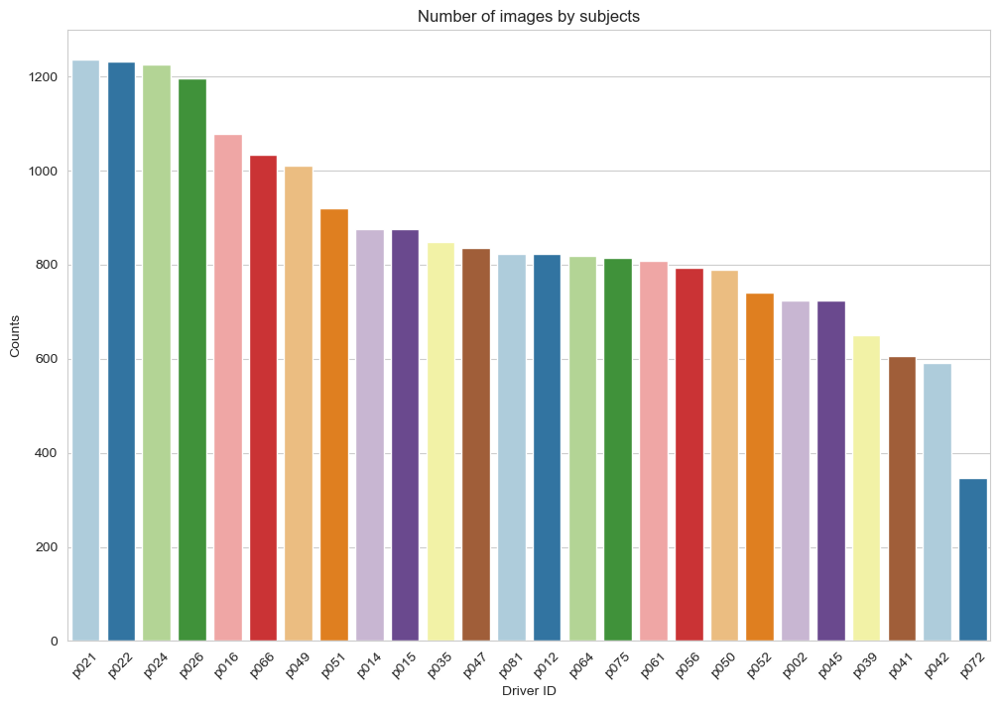

In [10]:
drivers_id = pd.DataFrame((dataset['subject'].value_counts()).reset_index())
drivers_id.columns = ['driver_id', 'Counts']

sns.set_style("whitegrid")

# Create the bar chart
plt.figure(figsize=(12, 8))  # Adjust the figure size as necessary
sns.barplot(data=drivers_id, x='driver_id', y='Counts', palette='Paired')

# Add title and labels as necessary
plt.title('Number of images by subjects')
plt.xlabel('Driver ID')
plt.ylabel('Counts')

# Improve layout
plt.xticks(rotation=45)  # Rotate the x labels to make them more readable

plt.show()

## Images overview

Let's take a look at the various images in the dataset.

In [11]:
# Assuming 'model' and 'activity_map' are already defined
activity_map = {
    'c0': 'Safe driving', 
    'c1': 'Texting - right', 
    'c2': 'Talking on the phone - right', 
    'c3': 'Texting - left', 
    'c4': 'Talking on the phone - left', 
    'c5': 'Operating the radio', 
    'c6': 'Drinking', 
    'c7': 'Reaching behind', 
    'c8': 'Hair and makeup', 
    'c9': 'Talking to passenger'
}

In [12]:
def display_training_images(base_dir, num_images=10, figsize=(10, 20)):
    plt.figure(figsize=figsize)
    directories = [d for d in os.listdir(base_dir) if os.path.isdir(os.path.join(base_dir, d))]
    image_paths = []

    for directory in directories:
        dir_path = os.path.join(base_dir, directory)
        files = [f for f in os.listdir(dir_path) if not f.startswith('.')]
        for file in files:
            image_paths.append((os.path.join(dir_path, file), directory))

    selected_paths = random.sample(image_paths, min(len(image_paths), num_images))

    for i, (img_path, class_key) in enumerate(selected_paths, start=1):
        plt.subplot(5, 2, i)
        img = mpimg.imread(img_path)
        plt.imshow(img)
        title = activity_map.get(class_key, "Unknown")
        plt.title(title)
        plt.axis('off')

    plt.tight_layout()
    plt.show()

In [13]:
def display_images_and_predict(base_dir, model, num_images=10, figsize=(10, 20), has_subdirs=True):
    plt.figure(figsize=figsize)
    image_paths = []

    if has_subdirs:  # For validation directory
        directories = [d for d in os.listdir(base_dir) if os.path.isdir(os.path.join(base_dir, d))]
        for directory in directories:
            dir_path = os.path.join(base_dir, directory)
            files = [f for f in os.listdir(dir_path) if not f.startswith('.')]
            image_paths.extend([(os.path.join(dir_path, file), directory) for file in files])
    else:  # For test directory
        files = [f for f in os.listdir(base_dir) if os.path.isfile(os.path.join(base_dir, f)) and not f.startswith('.')]
        image_paths.extend([(os.path.join(base_dir, file), "Unknown") for file in files])

    selected_paths = random.sample(image_paths, min(len(image_paths), num_images))

    for i, (img_path, _) in enumerate(selected_paths, start=1):
        img = image.load_img(img_path, target_size=(224, 224))
        x = image.img_to_array(img)
        x = preprocess_input(x)
        x = np.expand_dims(x, axis=0)

        pred = model.predict(x)
        predicted_class = np.argmax(pred, axis=1)[0]
        label = activity_map.get(f'c{predicted_class}', "Prediction Error")

        plt.subplot(5, 2, i)
        display_image = mpimg.imread(img_path)
        plt.imshow(display_image)
        plt.title(label)
        plt.axis('off')

    plt.tight_layout()
    plt.show()

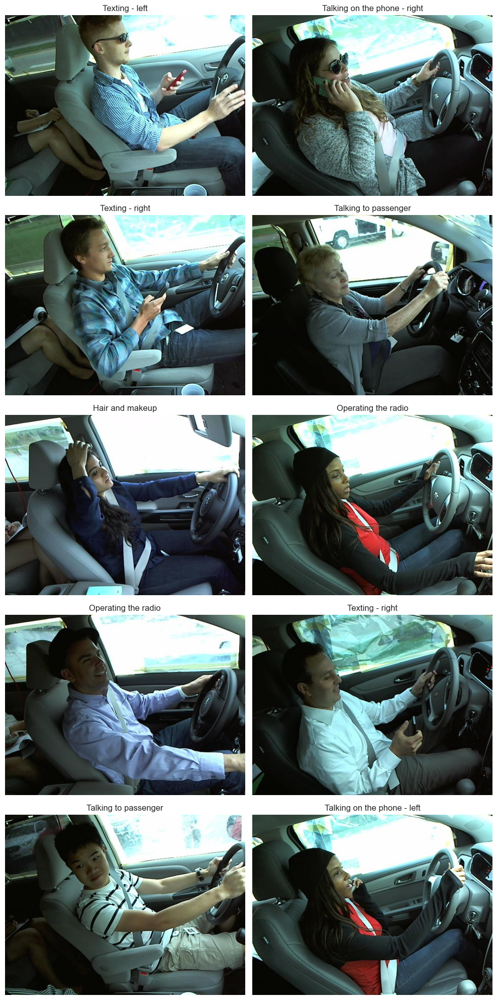

In [14]:
display_training_images(TRAIN_DIR)

# CNN Model
**Architecture :**

- Transfer learning from mobile net
- A GlobalAveragePooling2D
- 1 Dense layer with Relu and Dropouts
- 1 Dense layer with softmax for the classification

In [15]:
def select_and_load_best_model(model_type):
    pattern = rf'model_{model_type}_(.*).h5'  # Raw f-string to handle the regular expression
    models = [f for f in os.listdir() if re.match(pattern, f)]
    best_model = max(models, key=lambda x: float(re.findall(rf"model_{model_type}_(.*).h5", x)[0]))
    print(f"Loading best model: {best_model}")
    return load_model(best_model)

In [16]:
def create_model():

    base_model = MobileNet(weights='imagenet', include_top=False)
    x = base_model.output

    x = GlobalAveragePooling2D(name='avg_pool')(x)
    x = Dropout(0.4)(x)

    outputs = Dense(CLASSES, activation='softmax')(x)

    # Make sure to freeze the layers of the base model
    for layer in base_model.layers:
        layer.trainable = False

    model = Model(inputs=base_model.input, outputs=outputs)
    model.summary()

    return model

In [17]:
model = create_model()

# Compiling the model
model.compile(optimizer='rmsprop', loss='categorical_crossentropy', metrics=['accuracy'])

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, None, None, 3)]   0         
                                                                 
 conv1 (Conv2D)              (None, None, None, 32)    864       
                                                                 
 conv1_bn (BatchNormalizati  (None, None, None, 32)    128       
 on)                                                             
                                                                 
 conv1_relu (ReLU)           (None, None, None, 32)    0         
                                                                 
 conv_dw_1 (DepthwiseConv2D  (None, None, None, 32)    288       
 )                                                               
                                                                 
 conv_dw_1_bn (BatchNormali  (None, None, None, 32)    128   

In [18]:
train_datagen = ImageDataGenerator(
    preprocessing_function=preprocess_input,
    rotation_range=40,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    fill_mode='nearest')

validation_datagen = ImageDataGenerator(
    preprocessing_function=preprocess_input,
    rotation_range=40,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    fill_mode='nearest')

In [19]:
# Set image dimensions and batch size
WIDTH = 299
HEIGHT = 299
BATCH_SIZE = 32

In [20]:
WIDTH = 299
HEIGHT = 299
# Create the data generators
train_generator = train_datagen.flow_from_directory(
    TRAIN_DIR,
    target_size=(HEIGHT, WIDTH),  # Ensure this matches the model's expected input dimensions
    batch_size=BATCH_SIZE,
    class_mode='categorical')

validation_generator = validation_datagen.flow_from_directory(
    VALIDATION_DIR,
    target_size=(HEIGHT, WIDTH),  # Ensure this matches the model's expected input dimensions
    batch_size=BATCH_SIZE,
    class_mode='categorical')

Found 17943 images belonging to 10 classes.
Found 4481 images belonging to 10 classes.


In [21]:
model_type="CNN_3"
timestamp = datetime.now().strftime('%Y-%m-%d_%H-%M-%S')
model_type = f"{model_type}_{timestamp}"
callback_list = [
        EarlyStopping(monitor='val_accuracy', patience=5),
        ModelCheckpoint(filepath=f'model_{model_type}_{{val_accuracy:.4f}}.h5', save_best_only=True, save_weights_only=False, monitor='val_accuracy', mode='max', verbose=1)
    ]
EPOCHS = 100
STEPS_PER_EPOCH = train_generator.n // train_generator.batch_size
VALIDATION_STEPS = validation_generator.n // validation_generator.batch_size
history = model.fit(train_generator, validation_data=validation_generator, epochs=EPOCHS, callbacks=callback_list, validation_steps=VALIDATION_STEPS, steps_per_epoch=STEPS_PER_EPOCH, verbose=True)

Epoch 1/100
560/560 [==============================] - ETA: 0s - loss: 1.7526 - accuracy: 0.4047
Epoch 1: val_accuracy improved from -inf to 0.61942, saving model to model_CNN_3_2024-03-04_12-18-01_0.6194.h5
560/560 [==============================] - 263s 468ms/step - loss: 1.7526 - accuracy: 0.4047 - val_loss: 1.2177 - val_accuracy: 0.6194
Epoch 2/100
560/560 [==============================] - ETA: 0s - loss: 1.1225 - accuracy: 0.6393
Epoch 2: val_accuracy improved from 0.61942 to 0.71652, saving model to model_CNN_3_2024-03-04_12-18-01_0.7165.h5
560/560 [==============================] - 262s 468ms/step - loss: 1.1225 - accuracy: 0.6393 - val_loss: 0.9409 - val_accuracy: 0.7165
Epoch 3/100
560/560 [==============================] - ETA: 0s - loss: 0.9238 - accuracy: 0.7029
Epoch 3: val_accuracy improved from 0.71652 to 0.77857, saving model to model_CNN_3_2024-03-04_12-18-01_0.7786.h5
560/560 [==============================] - 273s 487ms/step - loss: 0.9238 - accuracy: 0.7029 - val_l

In [28]:
# Automatically select and load the best model
best_model = select_and_load_best_model(model_type)

Loading best model: model_CNN_3_2024-03-04_12-18-01_0.8683.h5


In [29]:
evaluation_generator = validation_datagen.flow_from_directory(
    VALIDATION_DIR,
    target_size=(HEIGHT, WIDTH),
    batch_size=BATCH_SIZE,
    class_mode='categorical',
    shuffle=False)

val_loss, val_accuracy = best_model.evaluate(evaluation_generator, steps=VALIDATION_STEPS)

print(f"Validation accuracy: {val_accuracy * 100:.2f}%")

Found 4481 images belonging to 10 classes.
140/140 [==============================] - 53s 377ms/step - loss: 0.4201 - accuracy: 0.8616
Validation accuracy: 86.16%


# Prediction on the validation set

In [33]:
# Get predictions
predictions = best_model.predict(evaluation_generator, steps=np.ceil(evaluation_generator.samples / evaluation_generator.batch_size))
predicted_classes = np.argmax(predictions, axis=1)

# True labels
true_classes = evaluation_generator.classes
class_labels = list(evaluation_generator.class_indices.keys()) 

# Combine class keys with labels from activity_map for target_names
target_names = [f"{class_key.upper()}({activity_map[class_key]})" for class_key in class_labels]

# Now generate the classification report with formatted labels
print(classification_report(true_classes, predicted_classes, target_names=target_names))

141/141 [==============================] - 53s 376ms/step
                                  precision    recall  f1-score   support

                C0(Safe driving)       0.71      0.86      0.78       497
             C1(Texting - right)       0.90      0.91      0.90       453
C2(Talking on the phone - right)       0.89      0.94      0.91       463
              C3(Texting - left)       0.94      0.90      0.92       469
 C4(Talking on the phone - left)       0.85      0.94      0.89       465
         C5(Operating the radio)       0.97      0.82      0.89       462
                    C6(Drinking)       0.89      0.85      0.87       465
             C7(Reaching behind)       0.90      0.92      0.91       400
             C8(Hair and makeup)       0.83      0.66      0.73       382
        C9(Talking to passenger)       0.78      0.80      0.79       425

                        accuracy                           0.86      4481
                       macro avg       0.87      0.8

1/1 [==============================] - 0s 21ms/step


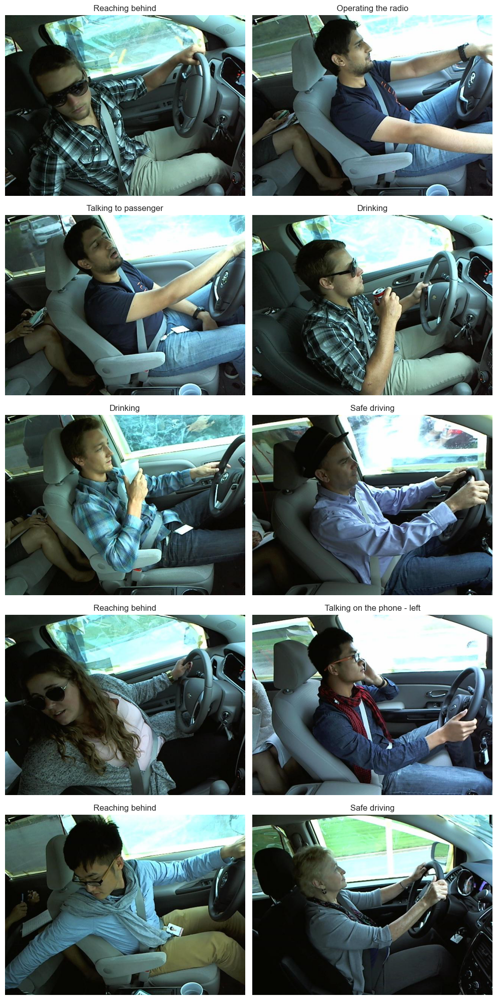

In [34]:
display_images_and_predict(VALIDATION_DIR, best_model)

# Prediction on test set

1/1 [==============================] - 0s 23ms/step


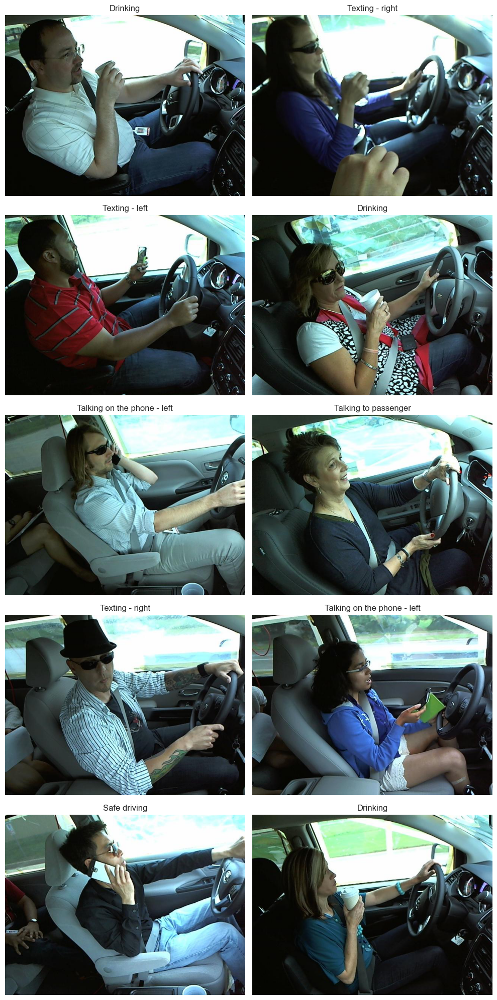

In [49]:
display_images_and_predict(TEST_DIR, best_model, has_subdirs=False)

# Creating submission.csv

In [54]:
def predict_image(model, img_path, target_size=(224, 224)):
    img = image.load_img(img_path, target_size=target_size)
    img_array = image.img_to_array(img)
    img_array_expanded = np.expand_dims(img_array, axis=0)
    img_preprocessed = preprocess_input(img_array_expanded)
    
    return model.predict(img_preprocessed)

In [51]:
test_images = glob(os.path.join(TEST_DIR, '*.jpg'))

In [55]:
predictions = []
filenames = []

for img_path in test_images:
    pred = predict_image(best_model, img_path)
    predictions.append(pred[0])
    filenames.append(os.path.basename(img_path))

1/1 [==============================] - 0s 27ms/step


1/1 [==============================] - 0s 42ms/step


In [56]:
# Create a DataFrame
submission_df = pd.DataFrame(predictions, columns=[f'c{i}' for i in range(10)])
submission_df.insert(0, 'img', filenames)

# Save to CSV
submission_csv_path = 'submission.csv'
submission_df.to_csv(submission_csv_path, index=False)

print(f'Submission file saved to {submission_csv_path}')

Submission file saved to submission.csv


# Conclusion

- Our dataset was organized into training and test directories. The training directory contained images within subdirectories corresponding to their respective classes, while the test directory housed all images within a single directory.
- We undertook preprocessing steps to create a validation directory, transferring 20% of the images from each category into corresponding subdirectories under the validation directory. This was done to ensure a fair distribution of data for model training and validation.
- We've done necesaary EDA , and developed a CNN model utilizing transfer learning techniques from MobileNet.
- The model achieved an accuracy of 86.16% on the validation set. Additionally, we've generated a classification report covering all categories present in the dataset. While the accuracy is solid for an initial model, there is significant scope for enhancement.
- Predictions were also made on a test set comprising nearly 80,000 images.
- A submission.csv file has been produced, listing the name of each test image along with the predicted probability for each class associated with that image.